<a href="https://colab.research.google.com/github/mobarakol/DARES_MedICSS2024/blob/main/DAM_AF_SFMLearner_Zero_Shot_Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Connecting with google drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Download Code from the updated repo (corner=true)

In [2]:
!git clone https://github.com/mobarakol/AF-SfMLearner.git
%cd AF-SfMLearner

!gdown 1trvLsQvXpsILHTZPR-FU5z6Au4YZLwRP
!mv gt_depths.npz /content/AF-SfMLearner/splits/endovis

Cloning into 'AF-SfMLearner'...
remote: Enumerating objects: 348, done.
remote: Counting objects: 100% (165/165), done.
remote: Compressing objects: 100% (82/82), done.
remote: Total 348 (delta 91), reused 154 (delta 81), pack-reused 183
Receiving objects: 100% (348/348), 4.86 MiB | 8.07 MiB/s, done.
Resolving deltas: 100% (165/165), done.
/content/AF-SfMLearner
Downloading...
From (original): https://drive.google.com/uc?id=1trvLsQvXpsILHTZPR-FU5z6Au4YZLwRP
From (redirected): https://drive.google.com/uc?id=1trvLsQvXpsILHTZPR-FU5z6Au4YZLwRP&confirm=t&uuid=4c93e314-ed10-41bb-a45d-c106a2f917b4
To: /content/AF-SfMLearner/gt_depths.npz
100% 811M/811M [00:17<00:00, 45.2MB/s]


Network Parameter:Depth DAM

In [2]:
import sys
import networks
from networks import Customised_DAM
from options import MonodepthOptions


options = MonodepthOptions()
class MonodepthOptions_notebook(MonodepthOptions):
    def __init__(self):
        super(MonodepthOptions_notebook, self).__init__()

    def parse(self):
        if 'ipykernel' in sys.modules:
            self.options = self.parser.parse_args([])
        else:
            self.options = self.parser.parse_args()
        return self.options


opt = MonodepthOptions_notebook().parse()

models = {}
models["depth_model"] = Customised_DAM()

total_params_depth = sum(p.numel() for p in models["depth_model"].parameters())
print(f"Number of total parameters total_params_depth: {total_params_depth}")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


LoRA params initialized!
Number of total parameters SAMed: 24932545


Network Parameter:Depth AF-SfMLearner

In [7]:
models["encoder"] = networks.ResnetEncoder(opt.num_layers, opt.weights_init == "pretrained")
models["depth"] = networks.DepthDecoder(models["encoder"].num_ch_enc, opt.scales)

total_params_depth_encoder = sum(p.numel() for p in models["encoder"].parameters())
print(f"Number of total parameters total_params_depth_encoder: {total_params_depth_encoder}")

total_params_depth_decoder = sum(p.numel() for p in models["depth"].parameters())
print(f"Number of total parameters total_params_depth_decoder: {total_params_depth_decoder}")

print(f"Overall Depth Network AF-SfMLearner: {total_params_depth_encoder + total_params_depth_decoder}")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Number of total parameters total_params_depth_encoder: 11689512
Number of total parameters total_params_depth_decoder: 3152724
Overall Depth Network AF-SfMLearner: 14842236


Network Parameter:pose

In [5]:
models["pose_encoder"] = networks.ResnetEncoder(opt.num_layers,opt.weights_init == "pretrained", num_input_images=2)
models["pose"] = networks.PoseDecoder(models["pose_encoder"].num_ch_enc,num_input_features=1,num_frames_to_predict_for=2)

total_params_pose_encoder = sum(p.numel() for p in models["pose_encoder"].parameters())
print(f"Number of total parameters total_params_pose_encoder: {total_params_pose_encoder}")

total_params_pose_decoder = sum(p.numel() for p in models["pose"].parameters())
print(f"Number of total parameters total_params_pose_decoder: {total_params_pose_decoder}")

Number of total parameters total_params_pose_encoder: 11698920
Number of total parameters total_params_pose_decoder: 1314572


Network Parameter:regulariser

In [6]:
models["position_encoder"] = networks.ResnetEncoder(opt.num_layers, opt.weights_init == "pretrained", num_input_images=2)
models["position"] = networks.PositionDecoder(models["position_encoder"].num_ch_enc, opt.scales)
models["transform_encoder"] = networks.ResnetEncoder(opt.num_layers, opt.weights_init == "pretrained", num_input_images=2)
models["transform"] = networks.TransformDecoder(models["transform_encoder"].num_ch_enc, opt.scales)

total_params_position_encoder = sum(p.numel() for p in models["position_encoder"].parameters())
total_params_position = sum(p.numel() for p in models["position"].parameters())
total_params_transform_encoder = sum(p.numel() for p in models["transform_encoder"].parameters())
total_params_transform = sum(p.numel() for p in models["transform"].parameters())

overall_regu = total_params_position_encoder + total_params_position + total_params_transform_encoder + total_params_transform

print(f"Number of total parameters overall_regu: {overall_regu}")

Number of total parameters overall_regu: 29709780


Custom_DAM:

In [ ]:
!python evaluate_depth_dam.py --zero_shot --data_path /content/drive/MyDrive/DARES/SCARED_Images_Resized --max_depth 150.0 --eval_mono --load_weights_folder /content/drive/MyDrive/DARES/af_sfmlearner_weights_media

2024-07-16 13:03:27.029552: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-16 13:03:27.029620: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-16 13:03:27.031428: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-16 13:03:27.041694: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-16 13:03:28.775897: W tensorflow/compiler/tf2

DAM Huggingface:

In [ ]:
!python evaluate_depth_dam_hf.py --zero_shot --data_path /content/drive/MyDrive/DARES/SCARED_Images_Resized --max_depth 150.0 --eval_mono --load_weights_folder /content/drive/MyDrive/DARES/af_sfmlearner_weights_media

2024-07-16 13:12:41.993291: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-16 13:12:41.993363: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-16 13:12:41.996395: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-16 13:12:42.010302: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-16 13:12:43.405925: W tensorflow/compiler/tf2

Pose for SCARED Seq 1:

In [ ]:
!python evaluate_pose.py --data_path /content/drive/MyDrive/DARES/SCARED_Images_Resized --load_weights_folder /content/drive/MyDrive/DARES/af_sfmlearner_weights_media --scared_pose_seq 1

2024-07-16 13:21:22.518749: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-16 13:21:22.518831: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-16 13:21:22.521651: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-16 13:21:22.537741: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-16 13:21:24.677995: W tensorflow/compiler/tf2

Pose for SCARED Seq 2:

In [ ]:
!python evaluate_pose.py --data_path /content/drive/MyDrive/DARES/SCARED_Images_Resized --load_weights_folder /content/drive/MyDrive/DARES/af_sfmlearner_weights_media --scared_pose_seq 2

2024-07-16 13:23:19.180339: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-16 13:23:19.180401: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-16 13:23:19.182008: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-16 13:23:19.190585: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-16 13:23:20.716902: W tensorflow/compiler/tf2

In [ ]:
!python visualize_pose.py --scared_pose_seq 1

Figure(640x480)


In [ ]:
!python visualize_pose.py --scared_pose_seq 2

Figure(640x480)


(<Figure size 640x480 with 1 Axes>,
 (0.0, 1.0, 0.0, 1.0),
 <matplotlib.image.AxesImage at 0x78603532c5e0>)

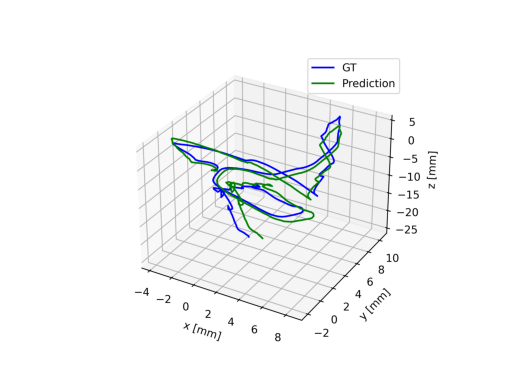

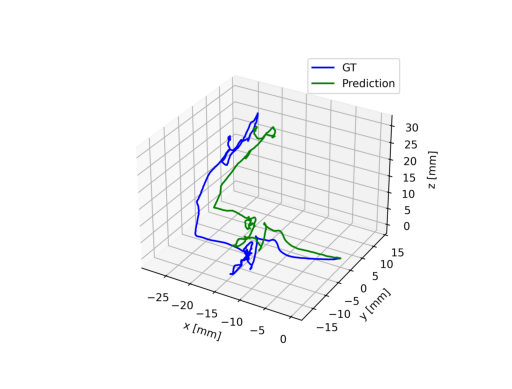

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
tr1 = Image.open('/content/AF-SfMLearner/trajectory_pose_seq1.png')
plt.figure(121), plt.axis('OFF'),plt.imshow(tr1)

tr1 = Image.open('/content/AF-SfMLearner/trajectory_pose_seq2.png')
plt.figure(122), plt.axis('OFF'),plt.imshow(tr1)

In [ ]:
!pip -q install open3d

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.7/399.7 MB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 82.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 68.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 65.5 MB/s eta 0:00:00


In [ ]:
!python evaluate_3d_reconstruction_dam.py --zero_shot --data_path /content/drive/MyDrive/DARES/SCARED_Images_Resized --eval_mono --load_weights_folder /content/drive/MyDrive/DARES/af_sfmlearner_weights_media --visualize_depth --save_recon

2024-07-16 13:27:50.569084: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-16 13:27:50.569148: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-16 13:27:50.571586: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-16 13:27:50.580441: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-16 13:27:52.118402: W tensorflow/compiler/tf2

In [ ]:
import open3d as o3d
import numpy as np
import plotly.graph_objects as go

print("Load a ply point cloud, print it, and render it")
ply_point_cloud = o3d.data.PLYPointCloud()
pcd = o3d.io.read_point_cloud('/content/AF-SfMLearner/splits/endovis/reconstruction/1_1_000001.ply')
points = np.asarray(pcd.points)
# print(pcd)
# print(np.asarray(pcd.points))

colors = None
if pcd.has_colors():
    colors = np.asarray(pcd.colors)
elif pcd.has_normals():
    colors = (0.5, 0.5, 0.5) + np.asarray(pcd.normals) * 0.5


fig = go.Figure(
  data=[
    go.Scatter3d(
      x=points[:,0], y=points[:,1], z=points[:,2],
      mode='markers',
      marker=dict(size=1, color=colors)
)
],
  layout=dict(
    scene=dict(
      xaxis=dict(visible=False),
      yaxis=dict(visible=False),
      zaxis=dict(visible=False)
)
)
)
fig.show()

Load a ply point cloud, print it, and render it
[Open3D INFO] Downloading https://github.com/isl-org/open3d_downloads/releases/download/20220201-data/fragment.ply
[Open3D INFO] Downloaded to /root/open3d_data/download/PLYPointCloud/fragment.ply
